In [ ]:
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


In [ ]:
# We import the modules to use
import os,sys
import cv2, numpy as np, math
from matplotlib import pyplot as plt
# change directory
%cd '/content/drive/My Drive'
#  the current directory
%pwd

# This allows to display images  and to save  them in cells
%matplotlib inline
# this definition allows to read files in a specific path
get_image = lambda route: os.path.join('/content/drive/My Drive/images', route)

/content/drive/My Drive




\#  **PRUEBA CONVOLUCIONANDO DOS LISTAS**




In [ ]:
import numpy as np
import time

def convolution(x, h):
    # Realiza la convolución entre x e h
    start_time = time.time()
    result = np.convolve(x, h, mode='full')
    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Tiempo de convolución: ", elapsed_time, "segundos")
    return result

# Define las listas para la convolución
x = [1, 2, 3, 4]
h = [0.5, 0.25, 0.75]

# Realiza la convolución
convolution_result = convolution(x, h)

# Imprime el resultado de la convolución
print("Resultado de la convolución:", convolution_result)


Tiempo de convolución:  0.0001747608184814453 segundos
Resultado de la convolución: [0.5  1.25 2.75 4.25 3.25 3.  ]


Tiempo de convolución con FFT: 0.0002586841583251953 segundos
Resultado de la convolución: [0.5  1.25 2.75 4.25 3.25 3.  ]


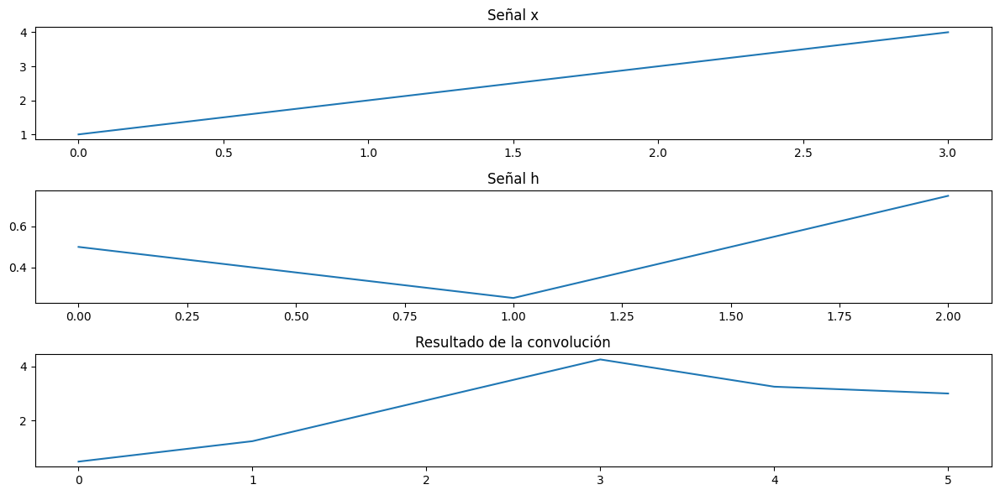

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time

def convolution_fft(x, h):
    start_time = time.time()

    # Calcula la longitud para el resultado de la convolución
    conv_length = len(x) + len(h) - 1

    # Aplica la Transformada de Fourier a x e h
    X = np.fft.fft(x, conv_length)
    H = np.fft.fft(h, conv_length)

    # Multiplica en el dominio de la frecuencia
    Y = X * H

    # Aplica la Transformada Inversa de Fourier para obtener la convolución
    convolution_result = np.fft.ifft(Y)

    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Tiempo de convolución con FFT:", elapsed_time, "segundos")

    return np.real(convolution_result)

# Define las listas para la convolución
x = [1, 2, 3, 4]
h = [0.5, 0.25, 0.75]

# Realiza la convolución utilizando la Transformada de Fourier
result = convolution_fft(x, h)

# Imprime el resultado de la convolución
print("Resultado de la convolución:", result)

# Grafica las señales y el resultado de la convolución
plt.figure(figsize=(12, 6))

# Gráfica la primera señal
plt.subplot(3, 1, 1)
plt.plot(x)
plt.title('Señal x')

# Gráfica la segunda señal
plt.subplot(3, 1, 2)
plt.plot(h)
plt.title('Señal h')

# Gráfica el resultado de la convolución
plt.subplot(3, 1, 3)
plt.plot(result)
plt.title('Resultado de la convolución')

plt.tight_layout()
plt.show()


#  **PRUEBA CONVOLUCIONANDO DOS IMÁGENES**


Tiempo de convolución con FFT: 0.04537200927734375 segundos


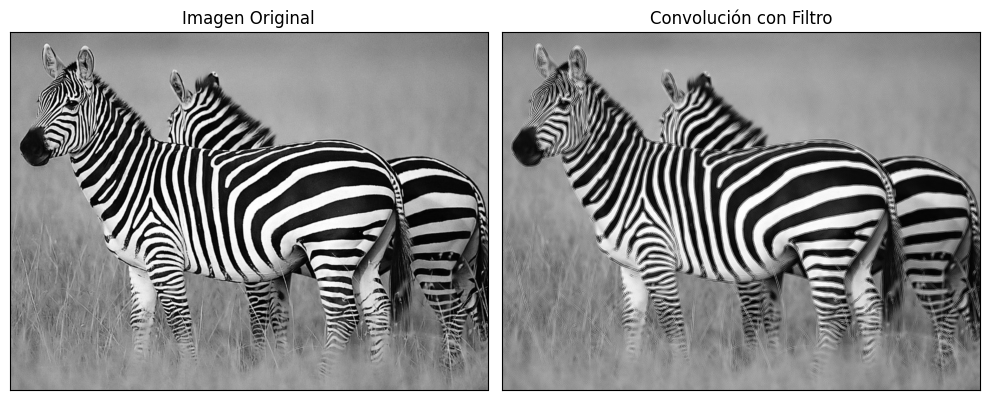

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Carga la imagen en escala de grises
im = cv2.imread(get_image('zebra.jpg'), cv2.IMREAD_GRAYSCALE)

# Define un kernel para la convolución
kernel = np.array([[1, 1, 1],
                   [1, -7, 1],
                   [1, 1, 1]])

# Aplica la convolución utilizando cv2.filter2D
start_time = time.time()
conv_image = cv2.filter2D(im, -1, kernel)
end_time = time.time()
elapsed_time = end_time - start_time
print("Tiempo de convolución con FFT:", elapsed_time, "segundos")

# Muestra la imagen original y el resultado de la convolución
plt.figure(figsize=(10, 8))

plt.subplot(121), plt.imshow(im, cmap='gray')
plt.title('Imagen Original'), plt.xticks([]), plt.yticks([])

plt.subplot(122), plt.imshow(conv_image, cmap='gray')
plt.title('Convolución con Filtro'), plt.xticks([]), plt.yticks([])

plt.tight_layout()
plt.show()


In [ ]:
from scipy.signal import fftconvolve #Que hace que no hago tio
from scipy.fft import fft, ifft
import scipy as s_p

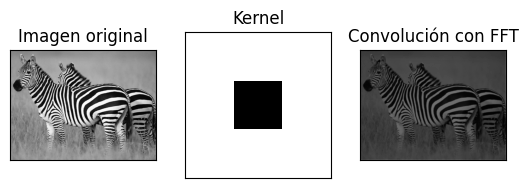

In [ ]:
import numpy as np
import cv2
from scipy.fft import fft, ifft
import matplotlib.pyplot as plt

def freq_domain_conv(im, ker):
    # Ajustar el tamaño del kernel para que coincida con la imagen
    ker_sh = ker.shape
    im_sh = im.shape
    ker = np.pad(ker, ((0, im_sh[0] - ker_sh[0]), (0, im_sh[1] - ker_sh[1])), 'constant')
    fftconvolve(im, kernel)
    # Realizar la FFT en el dominio espacial
    sp1 = fft(im)
    sp2 = fft(ker)  # Especificamos el tamaño de la FFT igual al tamaño de la imagen
    ret = ifft(sp1 * sp2)
    return ret


# Carga la imagen en escala de grises y normaliza
im = cv2.imread(get_image('zebra.jpg'), cv2.IMREAD_GRAYSCALE)

# Define un kernel para la convolución
kernel = np.array([[1, 1, 1],
                   [1, -7, 1],
                   [1, 1, 1]])

# Especifica los ejes para calcular la FFT (por ejemplo, para una imagen 2D, serían [0, 1])
axes_fft = [0, 1]  # Ajusta según sea necesario para tu aplicación
kernel = kernel / np.sum(kernel)
im = im / np.sum(im)

# Obtén las dimensiones de la imagen (supongamos que la imagen es 2D)
dimensiones_imagen = im.shape

# Establece el tamaño de la FFT para cada eje igual a las dimensiones de la imagen
shape_fft = [dimensiones_imagen]

# Realiza la convolución en el dominio de la frecuencia
resultado_fft = result = fftconvolve(im, kernel)

# Muestra las imágenes
plt.subplot(131), plt.imshow(im, cmap='gray')
plt.title('Imagen original'), plt.xticks([]), plt.yticks([])

plt.subplot(132), plt.imshow(kernel, cmap='gray')
plt.title('Kernel'), plt.xticks([]), plt.yticks([])

plt.subplot(133), plt.imshow(np.abs(resultado_fft), cmap='gray')
plt.title('Convolución con FFT'), plt.xticks([]), plt.yticks([])

plt.show()

Tiempo de convolución con fftconvolve: 0.7219047546386719 segundos


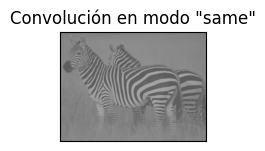

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.signal import fftconvolve

def _centered(arr, newshape):
    newshape = np.asarray(newshape)
    currshape = np.array(arr.shape)
    startind = (currshape - newshape) // 2
    endind = startind + newshape
    myslice = [slice(startind[k], endind[k]) for k in range(len(endind))]
    return arr[tuple(myslice)]

def convolution_fft3(image, kernel, mode='full'):
    start_time = time.time()

    # Ajustar el tamaño del kernel para que coincida con la imagen
    kernel_shape = kernel.shape
    padded_kernel = np.pad(kernel,
                           ((0, image.shape[0] - kernel_shape[0]),
                            (0, image.shape[1] - kernel_shape[1])),
                           'constant')

    # Calcular la Transformada de Fourier de la imagen y el kernel
    image_fft = np.fft.fft2(image)
    kernel_fft = np.fft.fft2(padded_kernel, s=image.shape)

    # Multiplicar en el dominio de la frecuencia
    result_fft = image_fft * kernel_fft

    # Calcular el tamaño y forma correctos para el modo
    axes = range(image.ndim)
    ret_shape = _apply_conv_mode(result_fft, image.shape, padded_kernel.shape, mode, axes)

    # Seleccionar la porción correcta del resultado
    if mode == 'full':
        result = np.fft.ifft2(result_fft, s=ret_shape).real
    elif mode == 'same':
        result = np.fft.ifft2(result_fft).real
        result = _centered(result, image.shape)
    elif mode == 'valid':
        result = np.fft.ifft2(result_fft, s=ret_shape).real
        result = _centered(result, [i - j + 1 for i, j in zip(image.shape, kernel_shape)])

    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Tiempo de convolución con fftconvolve:", elapsed_time, "segundos")

    return result

def _apply_conv_mode(ret, s1, s2, mode, axes):
    if mode == "full":
        return ret.copy()
    elif mode == "same":
        return _centered(ret, s1).copy()
    elif mode == "valid":
        shape_valid = [ret.shape[a] if a not in axes else s1[a] - s2[a] + 1
                       for a in range(ret.ndim)]
        return _centered(ret, shape_valid).copy()
    else:
        raise ValueError("Modo no válido. Modos aceptados: 'full', 'same', 'valid'.")

# Ejemplo de uso
im = cv2.imread(get_image('zebra.jpg'), cv2.IMREAD_GRAYSCALE)
kernel = np.array([[1, 1, 1],
                   [1, -7, 1],
                   [1, 1, 1]])
kernel = kernel / np.sum(kernel)

# Convolución en modo 'same' usando scipy.fft.fft2
result = convolution_fft3(im, kernel, mode='same')

# Mostrar resultado
plt.subplot(132), plt.imshow(result, cmap='gray')
plt.title('Convolución en modo "same"'), plt.xticks([]), plt.yticks([])
plt.show()



In [ ]:
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im has three-channels
    plt.imshow(im, cmap='jet')
  else:
    # im has a single-channel
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([])
  plt.show()

Tiempo de convolución con fftconvolve: 0.578606367111206 segundos
Tiempo de convolución con fftconvolve: 0.5073609352111816 segundos


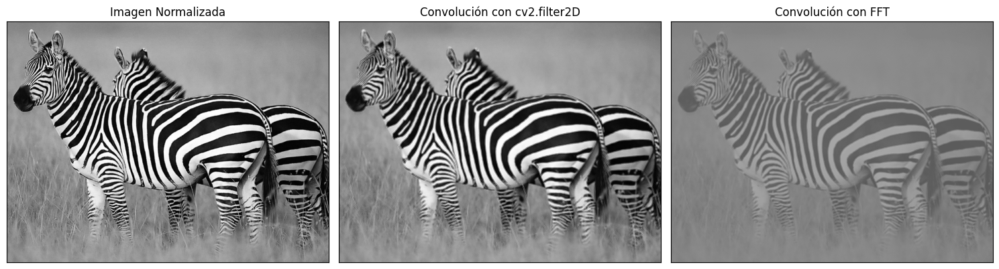

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import time


def convolution_fft2(image, kernel):
    start_time = time.time()

    # Ajustar el tamaño del kernel para que coincida con la imagen
    kernel_shape = kernel.shape
    padded_kernel = np.pad(kernel,
                           ((0, image.shape[0] - kernel_shape[0]),
                            (0, image.shape[1] - kernel_shape[1])),
                           'constant')

    # Calcular la Transformada de Fourier de la imagen y el kernel
    image_fft = np.fft.fft2(image)
    kernel_fft = np.fft.fft2(padded_kernel, s=image.shape)

    # Multiplicar en el dominio de la frecuencia
    result_fft = image_fft * kernel_fft

    # Aplicar la Transformada Inversa de Fourier para obtener la convolución
    result = np.fft.ifft2(result_fft).real

    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Tiempo de convolución con fftconvolve:", elapsed_time, "segundos")

    return result


im = cv2.imread(get_image('zebra.jpg'), cv2.IMREAD_GRAYSCALE)
kernel = np.array([[1, 1, 1],
                   [1, -7, 1],
                   [1, 1, 1]])
kernel = kernel / np.sum(kernel)

# Convolución en modo 'same' usando scipy.fft.fft2
result = convolution_fft3(im, kernel, mode='same')

# Aplica la convolución utilizando cv2.filter2D
conv_image_cv2 = cv2.filter2D(im, -1, kernel)

# Aplica la convolución utilizando la Transformada de Fourier
conv_image_fft = convolution_fft2(im, kernel)

# Muestra la imagen original y los resultados de la convolución
plt.figure(figsize=(15, 8))

plt.subplot(131), plt.imshow(im, cmap='gray')
plt.title('Imagen Normalizada'), plt.xticks([]), plt.yticks([])

plt.subplot(132), plt.imshow(conv_image_cv2, cmap='gray')
plt.title('Convolución con cv2.filter2D'), plt.xticks([]), plt.yticks([])

plt.subplot(133), plt.imshow(conv_image_fft, cmap='gray')
plt.title('Convolución con FFT'), plt.xticks([]), plt.yticks([])

plt.tight_layout()
plt.show()




Tiempo de convolución con FFT: 4.004653215408325 segundos
Resultado de la convolución:
[[4.1685729e-07 1.5771688e-07 3.1829126e-07 ... 3.1823552e-07
  2.3380815e-07 2.3094523e-07]
 [6.2803025e-07 2.5343363e-07 4.5342881e-07 ... 3.4073460e-07
  3.8020883e-07 4.3085188e-07]
 [4.9851781e-07 1.8870190e-07 3.5208342e-07 ... 3.0415305e-07
  3.1546864e-07 3.0416038e-07]
 ...
 [4.5907043e-07 2.5624766e-07 3.9429332e-07 ... 4.0831958e-07
  3.7739724e-07 3.2384256e-07]
 [4.7316411e-07 2.6753966e-07 4.1402851e-07 ... 3.8299402e-07
  3.5770427e-07 3.2949407e-07]
 [5.0413661e-07 2.6754014e-07 4.0276316e-07 ... 3.6046171e-07
  3.3517162e-07 3.2104407e-07]]


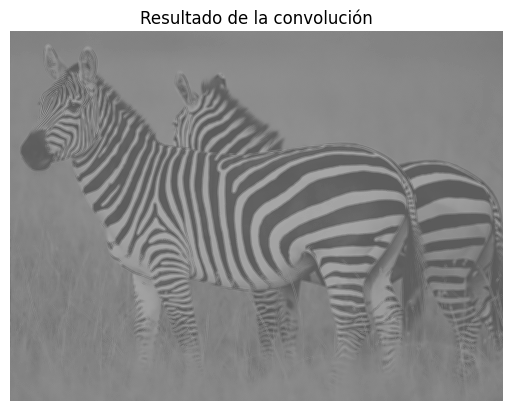

In [ ]:
import tensorflow as tf
import numpy as np
import time
import cv2

def convolution_fft(image, kernel):
    start_time = time.time()
    image = image / np.sum(image)

    # Calcular la Transformada de Fourier 2D de la imagen y el kernel
    image_fft = tf.signal.fft2d(tf.cast(image, tf.complex64))

    # Ajustar la forma del kernel para que coincida con la forma de la imagen
    kernel_shape = tf.shape(kernel)
    padded_kernel = tf.pad(kernel, [(0, image.shape[0] - kernel_shape[0]), (0, image.shape[1] - kernel_shape[1])])
    kernel_fft = tf.signal.fft2d(tf.cast(padded_kernel, tf.complex64))

    # Multiplicar en el dominio de la frecuencia
    result_fft = image_fft * kernel_fft

    # Aplicar la Transformada Inversa de Fourier para obtener la convolución
    result = tf.math.real(tf.signal.ifft2d(result_fft))

    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Tiempo de convolución con FFT:", elapsed_time, "segundos")

    return result.numpy()

# Carga la imagen en escala de grises y normaliza
im = cv2.imread(get_image('zebra.jpg'), cv2.IMREAD_GRAYSCALE)
normalized_im = im / np.sum(im)

# Define un kernel para la convolución
kernel = np.array([[1, 1, 1],
                   [1, -7, 1],
                   [1, 1, 1]])

# Normaliza el kernel para que la suma sea 1 (opcional)
kernel = kernel / np.sum(kernel)

# Convocar a la función
result_convolution = convolution_fft(normalized_im, kernel)

# Mostrar el resultado
print("Resultado de la convolución:")
print(result_convolution)

# Mostrar la imagen resultante
plt.imshow(result_convolution, cmap='gray')
plt.title('Resultado de la convolución')
plt.axis('off')  # Desactivar ejes
plt.show()



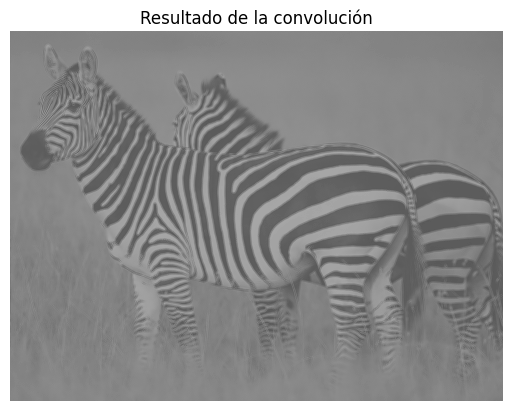

In [ ]:
import tensorflow as tf

def convolution_fft(image, kernel):

    # Ajustar la forma del kernel para que coincida con la forma de la imagen
    kernel_shape = tf.shape(kernel)
    padded_kernel = tf.pad(kernel, [(0, image.shape[0] - kernel_shape[0]), (0, image.shape[1] - kernel_shape[1])])
    kernel_fft = tf.signal.fft2d(tf.cast(padded_kernel, tf.complex64))
    convolution_result = fftconvolve(image, padded_kernel, mode="same")
    return result

# Ejemplo de uso
# Supongamos que 'image' y 'kernel' son tus imágenes de entrada
# Asegúrate de que las imágenes tengan el tipo de dato correcto y las dimensiones adecuadas
# Puedes cargarlas con TensorFlow o NumPy, dependiendo de tu caso

# Convocar a la función
# Carga la imagen en escala de grises y normaliza
im = cv2.imread(get_image('zebra.jpg'), cv2.IMREAD_GRAYSCALE)

# Define un kernel para la convolución
kernel = np.array([[1, 1, 1],
                   [1, -7, 1],
                   [1, 1, 1]])
normalized_im = im / np.sum(im)

# Normaliza el kernel para que la suma sea 1 (opcional)
kernel = kernel / np.sum(kernel)

# Realiza la convolución utilizando FFT
result_convolution = convolution_fft(im, kernel)


# Mostrar la imagen resultante
plt.imshow(result_convolution, cmap='gray')
plt.title('Resultado de la convolución')
plt.axis('off')  # Desactivar ejes
plt.show()

In [ ]:
print("Dispositivos disponibles:", tf.config.list_physical_devices())

# Asegurar que la GPU esté disponible
if tf.config.list_physical_devices('GPU'):
    print("GPU disponible")
else:
    print("No se encontró una GPU, asegúrate de que TensorFlow esté configurado correctamente.")


Dispositivos disponibles: [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]
No se encontró una GPU, asegúrate de que TensorFlow esté configurado correctamente.


In [ ]:
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

\#  **PRUEBA CONVOLUCIONANDO IMÁGENES**


Tiempo de convolución con fftconvolve: 0.024659156799316406 segundos
[[-551. -275. -259. ... -233. -223. -444.]
 [-272.  125.  129. ...  112.  108. -225.]
 [-265.  130.  132. ...  112.  110. -233.]
 ...
 [-291.  147.  147. ...  127.  117. -270.]
 [-287.  143.  145. ...  119.  114. -257.]
 [-579. -287. -293. ... -261. -258. -503.]]
Tiempo de convolución con fftconvolve: 0.5721652507781982 segundos
[[-551. -275. -259. ... -233. -223. -444.]
 [-272.  125.  129. ...  112.  108. -225.]
 [-265.  130.  132. ...  112.  110. -233.]
 ...
 [-291.  147.  147. ...  127.  117. -270.]
 [-287.  143.  145. ...  119.  114. -257.]
 [-579. -287. -293. ... -261. -258. -503.]]


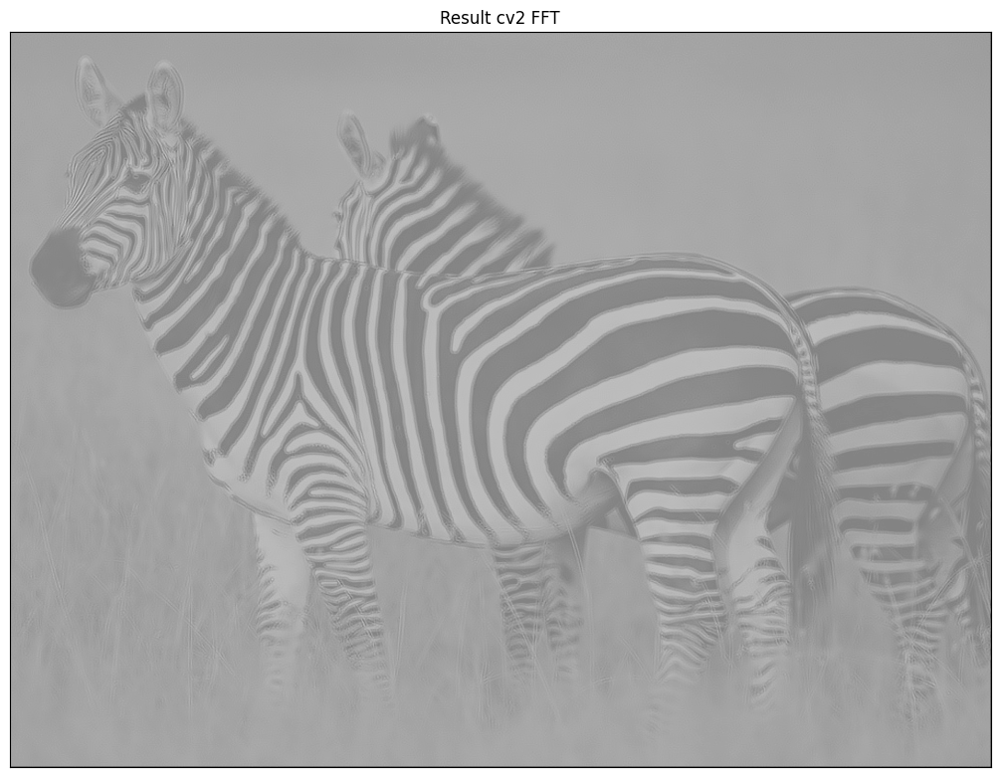

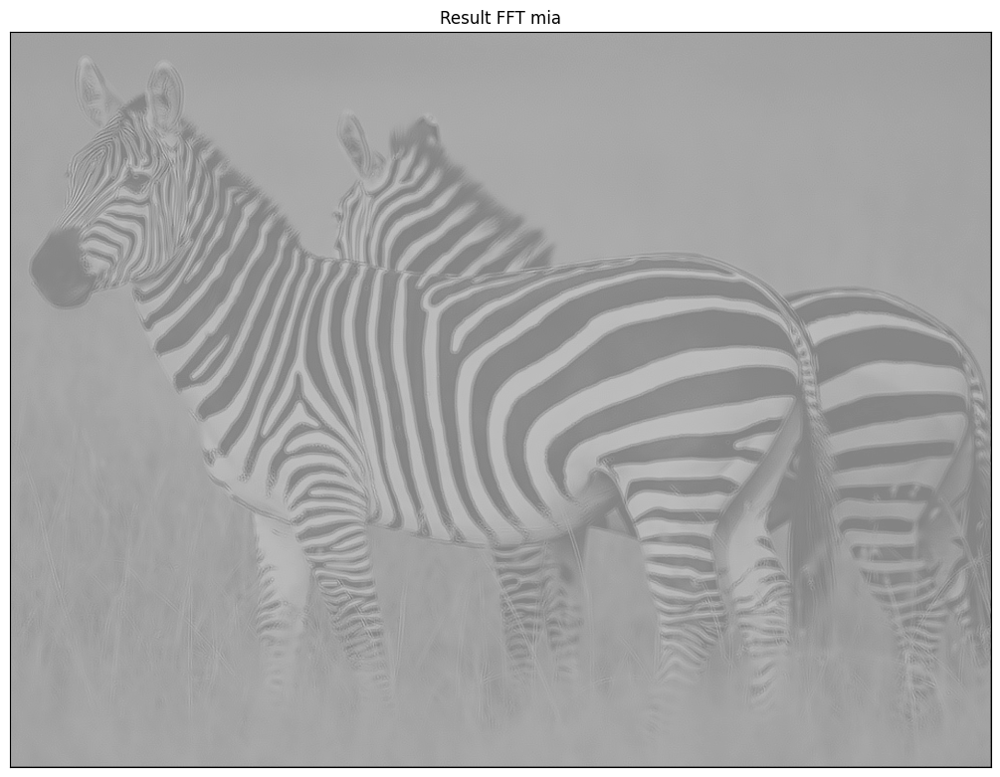

In [ ]:
def convolution_fft_diapositiva(image, kernel):

    # Ajustar el tamaño del kernel para que coincida con la imagen
    H,W = image.shape
    hs = kernel.shape[0]//2
    #fftsize=2048
    fftsize = max(2**int(np.ceil(np.log2(H + hs))), 2**int(np.ceil(np.log2(W + hs))))


    start_time = time.time()

    # Calcular la Transformada de Fourier de la imagen y el kernel
    image_fft = np.fft.fft2(image,(fftsize,fftsize))       #padding
    kernel_fft = np.fft.fft2(kernel, (fftsize,fftsize))    #padding


    # Multiplicar en el dominio de la frecuencia
    result_fft = image_fft * kernel_fft              #multiply fft images

    # Aplicar la Transformada Inversa de Fourier para obtener la convolución
    result_inversa = np.fft.ifft2(result_fft)         #inverse fft2

    result_inversa = result_inversa[hs:hs+H,hs:hs+W]  #remove padding

    result_inversa = np.real(result_inversa)
    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Tiempo de convolución con fftconvolve:", elapsed_time, "segundos")
    return result_inversa



im = cv2.imread(get_image('zebra.jpg'), cv2.IMREAD_GRAYSCALE)

kernel = np.array([[1, 1, 1],
                   [1, -7, 1],
                   [1, 1, 1]])
kernel = kernel / np.sum(kernel)

im = np.float64(im)

# Aplica la convolución utilizando cv2.filter2D
start_time = time.time()
conv_image_cv2 = cv2.filter2D(im, -1, kernel,borderType=cv2.BORDER_CONSTANT)
end_time = time.time()
elapsed_time = end_time - start_time
print("Tiempo de convolución con fftconvolve:", elapsed_time, "segundos")
print(conv_image_cv2)
# Aplica la convolución utilizando la Transformada de Fourier
conv_image_fft = convolution_fft_diapositiva(im, kernel)
print(conv_image_fft)

displayIm(conv_image_cv2,'Result cv2 FFT')
displayIm(conv_image_fft,'Result FFT mia')

In [ ]:
tf.config.experimental.list_physical_devices('GPU')

[]

Tiempo de convolución con cv: 0.016704320907592773 segundos
Tiempo de convolución con fftconvolve: 1.7828302383422852 segundos


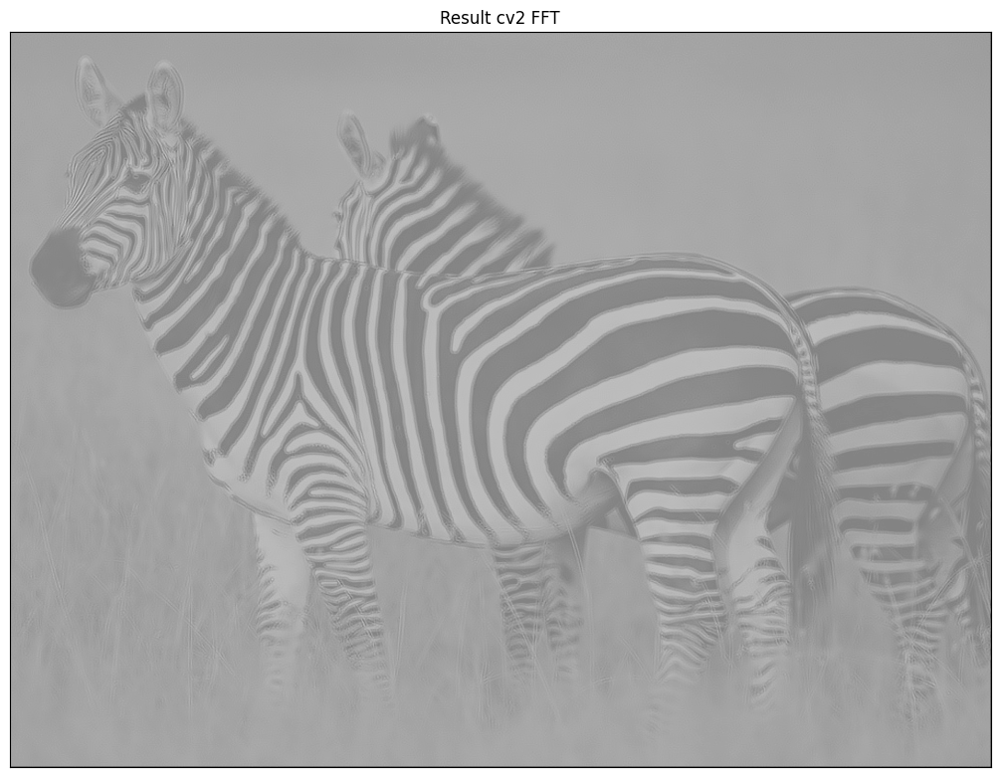

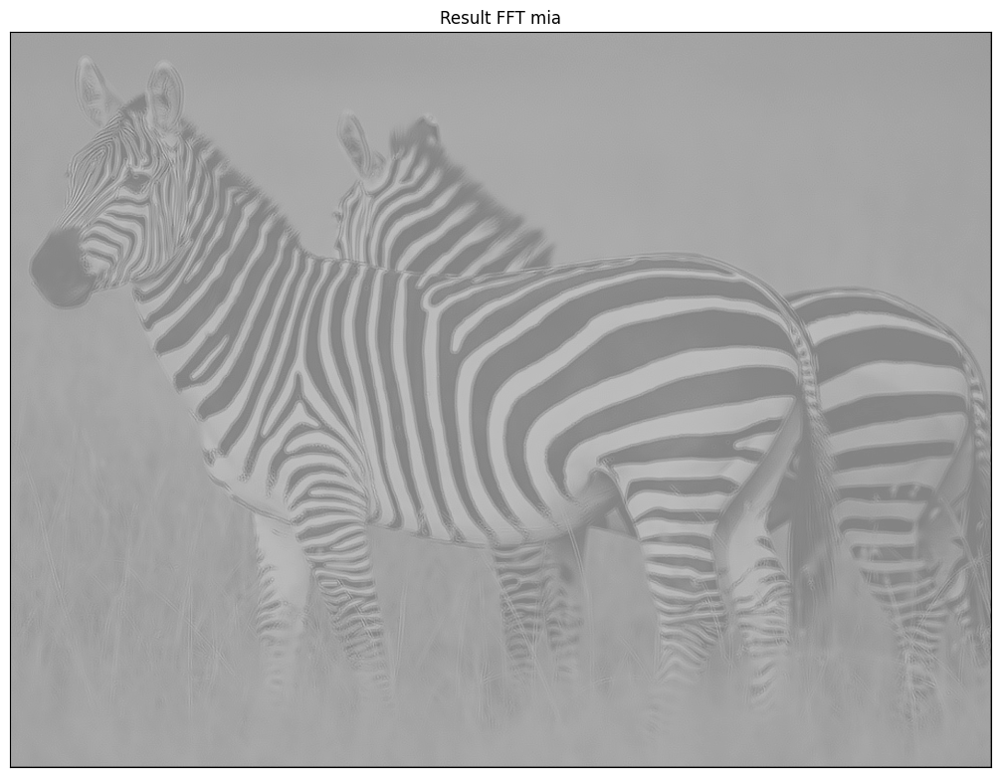

In [ ]:
#NO HE PODIDO PROBAR USANDO LA GPU  LA FUNCIÓNN PERO BUENO AQUÍ LA DEJO FALTA PROBAR, PERO NO DA PROBLEMAS DE USO


def convolution_fft_gpu(image, kernel):
    H, W = image.shape
    hs = kernel.shape[0] // 2

    # Calcula el tamaño de relleno en función de la potencia de 2 más cercana a las dimensiones originales
    #fftsize = max(2**int(np.ceil(np.log2(H + hs))), 2**int(np.ceil(np.log2(W + hs))))
    fftsize = 2**int(np.ceil(np.log2(max(H, W) + hs)))

     # Ajustar la forma del kernel para que coincida con la forma (fftsize,fftsize)
    kernel_shape = tf.shape(kernel)
    padded_kernel = tf.pad(kernel, [(0, fftsize - kernel_shape[0]), (0, fftsize - kernel_shape[1])])
    kernel_fft = tf.signal.fft2d(tf.cast(padded_kernel, tf.complex64))

    # Ajustar la forma de la imagen para que coincida con la forma (fftsize,fftsize)
    image_shape = tf.shape(image)
    padded_image = tf.pad(image, [(0, fftsize - image_shape[0]), (0, fftsize - image_shape[1])])
    image_fft = tf.signal.fft2d(tf.cast(padded_image, tf.complex64))

    # Realiza la multiplicación en el dominio de la frecuencia
    result_fft = image_fft * kernel_fft

    # Aplica la Transformada Inversa de Fourier para obtener la convolución
    result_inversa = tf.signal.ifft2d(result_fft)

    # Aplica el recorte para eliminar el relleno
    result_inversa = result_inversa[hs:hs+H, hs:hs+W]


    return tf.math.real(result_inversa).numpy()



im = cv2.imread(get_image('zebra.jpg'), cv2.IMREAD_GRAYSCALE)
im = np.float64(im)
im = im/np.sum(im)
kernel = np.array([[1, 1, 1],
                   [1, -7, 1],
                   [1, 1, 1]])
kernel = kernel / np.sum(kernel)

# Aplica la convolución utilizando cv2.filter2D
start_time = time.time()
conv_image_cv2 = cv2.filter2D(im, -1, kernel,borderType=cv2.BORDER_CONSTANT)
end_time = time.time()
elapsed_time = end_time - start_time
print("Tiempo de convolución con cv:", elapsed_time, "segundos")


# Aplica la convolución utilizando la Transformada de Fourier
start_time = time.time()
conv_image_fft = convolution_fft_gpu(im, kernel)
end_time = time.time()
elapsed_time = end_time - start_time
print("Tiempo de convolución con fftconvolve:", elapsed_time, "segundos")

displayIm(conv_image_cv2,'Result cv2 FFT')
displayIm(conv_image_fft,'Result FFT mia')

In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Función Gaussiana
def GaussFunc(x, sigma):
    return np.exp(-x**2 / (2 * sigma**2))

# Primera derivada de la función Gaussiana
def GaussDeriv1Func(x, sigma):
    return np.exp(-x**2 / (2 * sigma**2)) * (-x / (sigma**2))*sigma

# Segunda derivada de la función Gaussiana
def GaussDeriv2Func(x, sigma):
    return ((x**2 - sigma**2) / (sigma**4)) * np.exp(-x**2 / (2 * sigma**2))*(sigma**2)

# Función para crear y mostrar la máscara Gaussiana 1D
def gaussianMask1D(sigma=0, sizeMask=0, order=0):
    # Calcular sigma y sizeMask si no se proporcionan
    if sizeMask == 0:
        sizeMask = 2 * int(3 * sigma) + 1
    if sigma == 0:
        sigma = (sizeMask - 1) / 6.0

    k = int(3 * sigma)  # Parámetro k
    mask = np.zeros(sizeMask)  # Inicializar la máscara
    suma = 0  # Variable para normalizar la máscara

    # Calcular la máscara según el orden especificado
    if order == 0:
        for i in range(-k, k + 1):
            f_x = GaussFunc(i, sigma)
            mask[i + k] = f_x
            suma += f_x
        mask /= suma  # Normalizar la máscara

    elif order == 1:
        for i in range(-k, k + 1):
            mask[i + k] = GaussDeriv1Func(i, sigma)

    elif order == 2:
        for i in range(-k, k + 1):
            mask[i + k] = GaussDeriv2Func(i, sigma)

    # Crear un vector para la posición
    #vector = np.arange(-k, k + 1)

    # Graficar la máscara
    #plt.plot(vector, mask, label=f'Máscara {order}')
    #plt.xlabel('Posición')
    #plt.ylabel('Valor')
    #plt.title(f'Perfil de la Máscara Gaussiana (σ={sigma}, Tamaño={sizeMask})')
    #plt.legend()
    #plt.show()

    return mask


In [ ]:
def my2DConv(im, sigma, orders):
    ddepth = cv2.CV_64F
    maskG = gaussianMask1D(sigma, order=0)
    maskDG = gaussianMask1D(sigma, order=1)
    mask2DG = gaussianMask1D(sigma, order=2)

    #X que son filas o columnas ¿¿¿?¿?¿??¿¿?¿?¿?¿¿?¿¿?

    kernel = np.array([[2, 5, 2],
                   [4, 10, 4],
                   [2, 5, 2]])
    # Normaliza el kernel para que la suma sea 1 (opcional)
    kernel = kernel / np.sum(kernel)

    if orders == [0, 0]:  # Suavizado Gaussiano
      print(maskG)
      # Perform the matrix product (dot product)
      matriz_resultante = np.outer(maskG, maskG)
      return convolution_fft_gpu(im,matriz_resultante)


# Ordenes
orders_to_test = [[0, 0], [1, 0], [0, 1], [2, 0], [0, 2]]
im = cv2.imread(get_image('zebra.jpg'), cv2.IMREAD_GRAYSCALE)


In [ ]:
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im has three-channels
    plt.imshow(im, cmap='jet')
  else:
    # im has a single-channel
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([])
  plt.show()

In [ ]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [ ]:
def displayPyramid(vim, title='result'):
  temp = np.zeros_like(vim[0])
  if np.mod(temp.shape[1],2)==0:
    h = temp[:, :temp.shape[1]//2]
  else:
    h = temp[:, :(temp.shape[1]//2)+1]
  out = np.hstack((temp, h))
  top = 0
  out[0:vim[0].shape[0], 0:vim[0].shape[1]] = vim[0]
  left = vim[0].shape[1]
  for i in range(1, len(vim)):
    out[top:top+vim[i].shape[0], left:left + vim[i].shape[1]] = vim[i]
    top += vim[i].shape[0]
  displayIm(out, title)

[0.00147945 0.00380424 0.00875346 0.01802341 0.03320773 0.05475029
 0.08077532 0.106639   0.12597909 0.133176   0.12597909 0.106639
 0.08077532 0.05475029 0.03320773 0.01802341 0.00875346 0.00380424
 0.00147945]
[0.00147945 0.00380424 0.00875346 0.01802341 0.03320773 0.05475029
 0.08077532 0.106639   0.12597909 0.133176   0.12597909 0.106639
 0.08077532 0.05475029 0.03320773 0.01802341 0.00875346 0.00380424
 0.00147945]
[0.00147945 0.00380424 0.00875346 0.01802341 0.03320773 0.05475029
 0.08077532 0.106639   0.12597909 0.133176   0.12597909 0.106639
 0.08077532 0.05475029 0.03320773 0.01802341 0.00875346 0.00380424
 0.00147945]
[0.00147945 0.00380424 0.00875346 0.01802341 0.03320773 0.05475029
 0.08077532 0.106639   0.12597909 0.133176   0.12597909 0.106639
 0.08077532 0.05475029 0.03320773 0.01802341 0.00875346 0.00380424
 0.00147945]


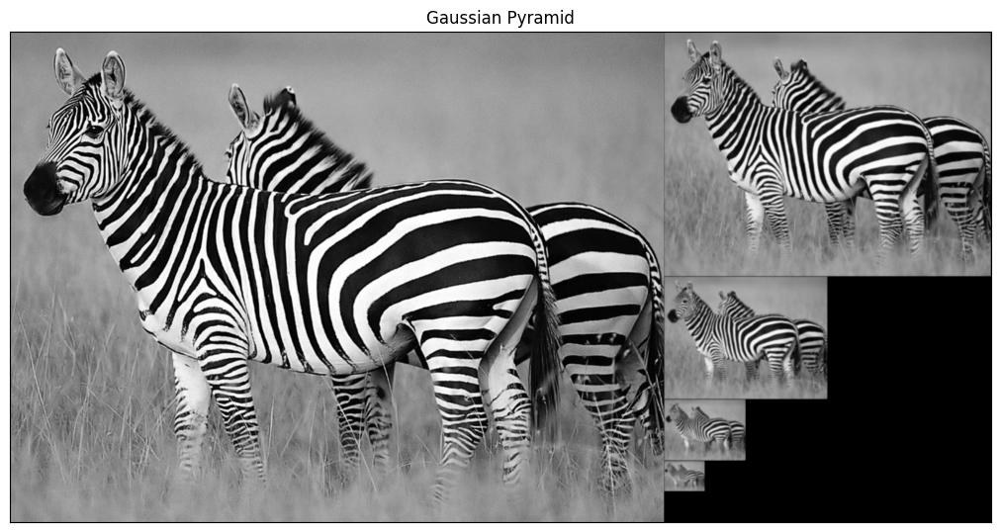

In [ ]:
def recortar (im1):
  #im = im1[1::2, 1::2]  # Selecciona filas e columnas impares
  #im = cv2.resize(im1, None, fx=1/2, fy=1/2, interpolation=cv2.INTER_LINEAR)
  im = cv2.resize(im1,(im1.shape[1]//2,im1.shape[0]//2),cv2.INTER_LINEAR)
  return im

def pyramidGauss(im,sizeMask=7, nlevel=4):
  vim=[im]
  sigma = 3.0
  for i in range (1,nlevel+1):
    imagen_suavizada = my2DConv(vim[i-1],sigma,[0,0])
    imagen = recortar(imagen_suavizada)
    vim.append(imagen)
  return vim

im=cv2.imread(get_image('zebra.jpg'),0)
pyrG = pyramidGauss(im,sizeMask=7, nlevel=4)
displayPyramid(pyrG,'Gaussian Pyramid')

[0.00147945 0.00380424 0.00875346 0.01802341 0.03320773 0.05475029
 0.08077532 0.106639   0.12597909 0.133176   0.12597909 0.106639
 0.08077532 0.05475029 0.03320773 0.01802341 0.00875346 0.00380424
 0.00147945]
[0.00147945 0.00380424 0.00875346 0.01802341 0.03320773 0.05475029
 0.08077532 0.106639   0.12597909 0.133176   0.12597909 0.106639
 0.08077532 0.05475029 0.03320773 0.01802341 0.00875346 0.00380424
 0.00147945]
[0.00147945 0.00380424 0.00875346 0.01802341 0.03320773 0.05475029
 0.08077532 0.106639   0.12597909 0.133176   0.12597909 0.106639
 0.08077532 0.05475029 0.03320773 0.01802341 0.00875346 0.00380424
 0.00147945]
[0.00147945 0.00380424 0.00875346 0.01802341 0.03320773 0.05475029
 0.08077532 0.106639   0.12597909 0.133176   0.12597909 0.106639
 0.08077532 0.05475029 0.03320773 0.01802341 0.00875346 0.00380424
 0.00147945]


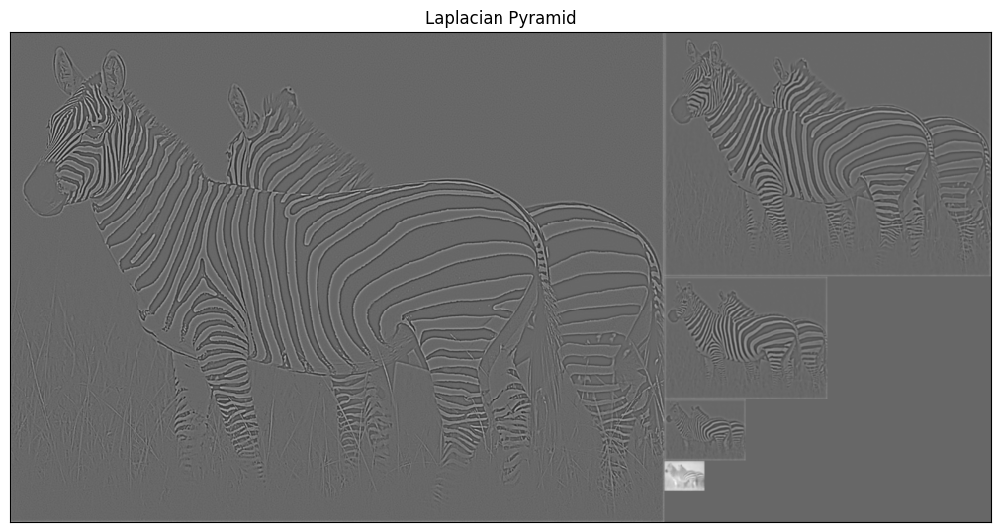

In [ ]:
def expandir(im1,target_height, target_width):
    # Redimensiona la imagen al doble de tamaño
    #im = cv2.resize(im1, None, fx=2, fy=2, interpolation=cv2.INTER_LINEAR)
    im = cv2.resize(im1,(target_width,target_height),cv2.INTER_LINEAR)
    return im

def pyramidLap(im, sizeMask, nlevel=4, flagInterp=cv2.INTER_LINEAR):
    # Genera la pirámide Gaussiana
    vim = pyramidGauss(im, sizeMask=sizeMask, nlevel=nlevel)
    vimL = []
    # Añade la última imagen de la pirámide Gaussiana a la pirámide Laplaciana
    vimL.append(vim[nlevel])
    for i in range(1, nlevel+1):
        imagen_expandida = expandir(vim[(nlevel+1)-i],vim[nlevel-i].shape[0],vim[nlevel-i].shape[1])
        imagen_nueva  = vim[nlevel-i] - imagen_expandida
        vimL.append(imagen_nueva)
    vimL.reverse()
    return vimL



# Resto del código
im = cv2.imread(get_image('zebra.jpg'), 0)
pyrL = pyramidLap(im, sizeMask=7, nlevel=4)
displayPyramid(pyrL, 'Laplacian Pyramid')

[0.00147945 0.00380424 0.00875346 0.01802341 0.03320773 0.05475029
 0.08077532 0.106639   0.12597909 0.133176   0.12597909 0.106639
 0.08077532 0.05475029 0.03320773 0.01802341 0.00875346 0.00380424
 0.00147945]
[0.00147945 0.00380424 0.00875346 0.01802341 0.03320773 0.05475029
 0.08077532 0.106639   0.12597909 0.133176   0.12597909 0.106639
 0.08077532 0.05475029 0.03320773 0.01802341 0.00875346 0.00380424
 0.00147945]
[0.00147945 0.00380424 0.00875346 0.01802341 0.03320773 0.05475029
 0.08077532 0.106639   0.12597909 0.133176   0.12597909 0.106639
 0.08077532 0.05475029 0.03320773 0.01802341 0.00875346 0.00380424
 0.00147945]
[0.00147945 0.00380424 0.00875346 0.01802341 0.03320773 0.05475029
 0.08077532 0.106639   0.12597909 0.133176   0.12597909 0.106639
 0.08077532 0.05475029 0.03320773 0.01802341 0.00875346 0.00380424
 0.00147945]


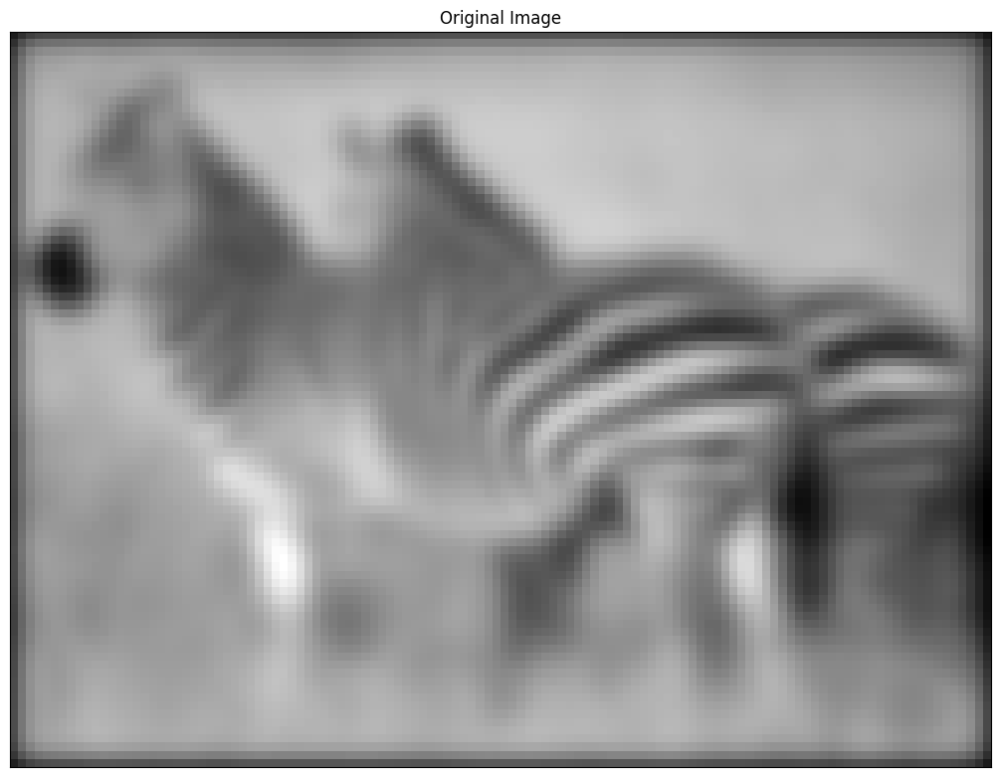

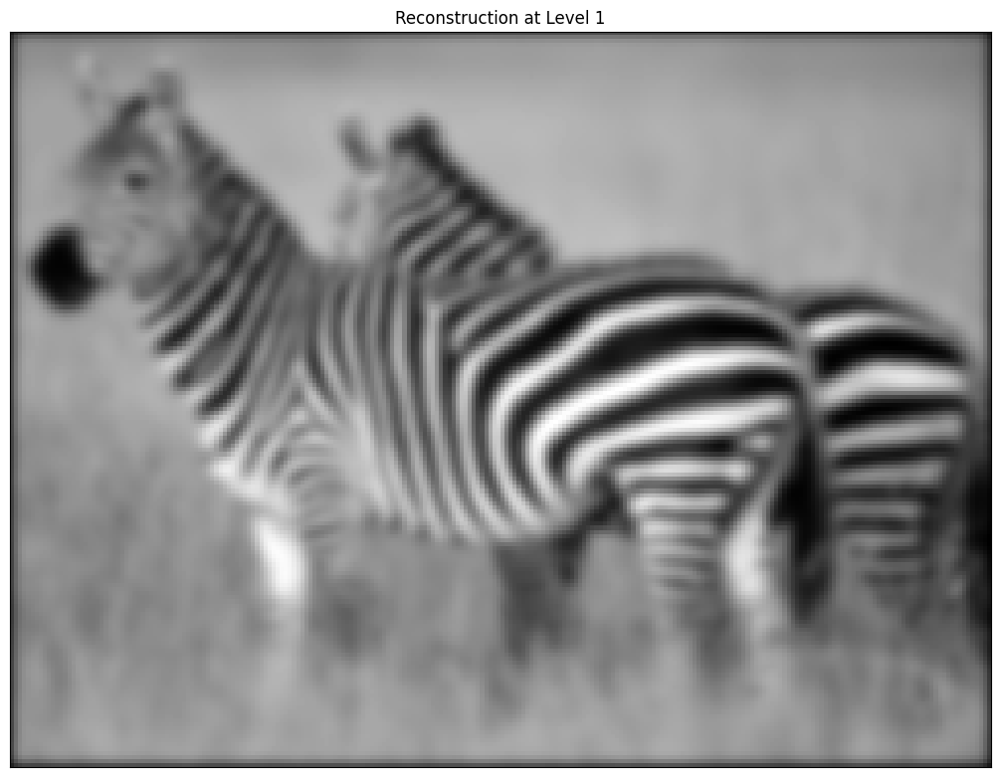

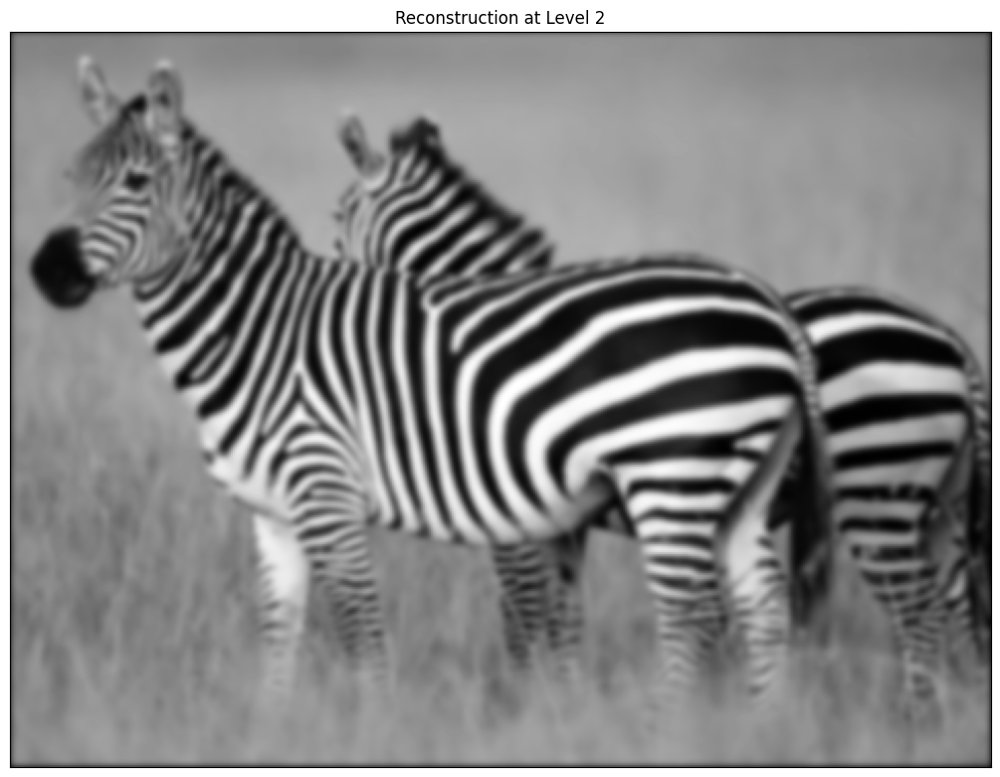

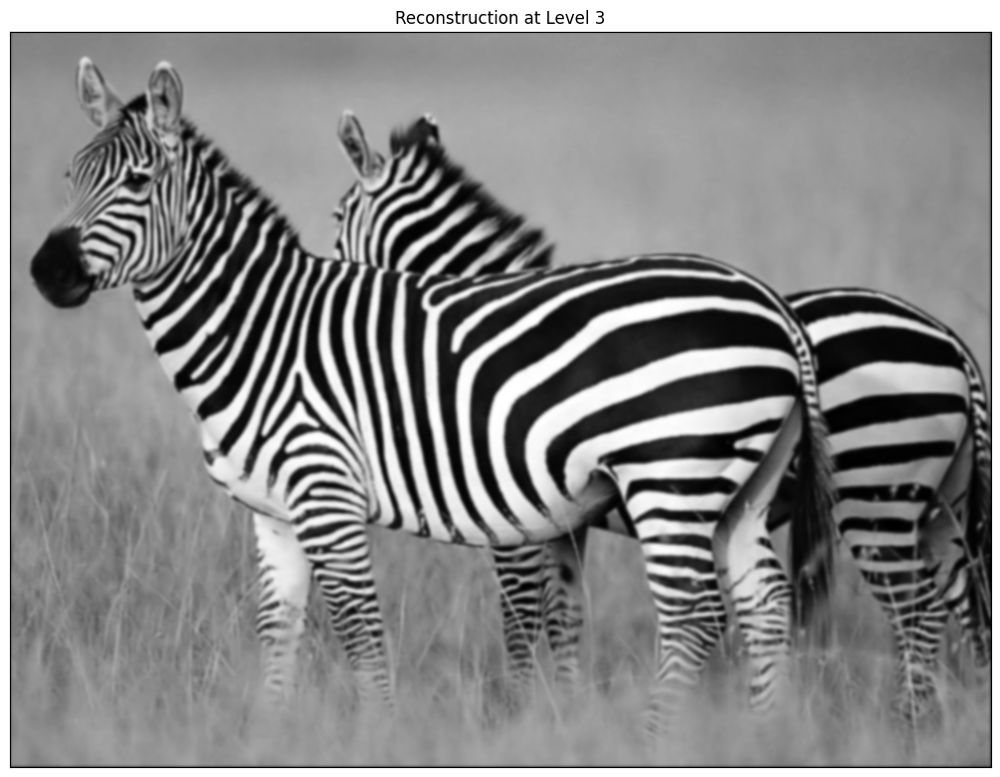

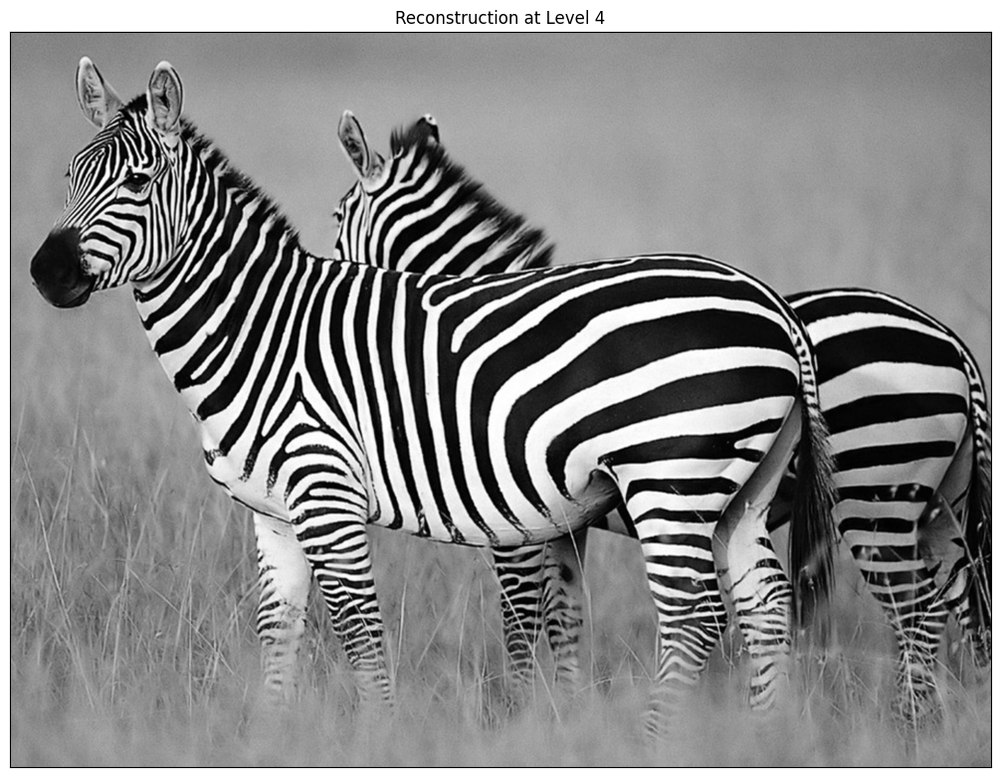

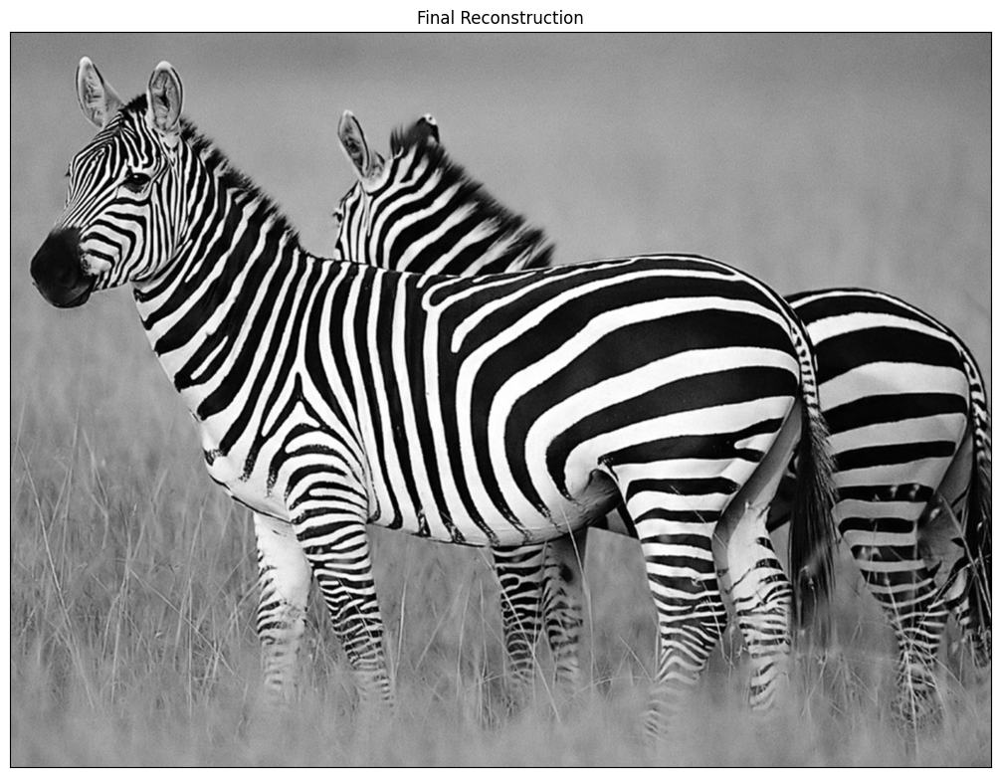

Error per pixel 0.0


In [ ]:
def reconstructLap(pyL, flagInterp):
    # Iniciar con la imagen más pequeña de la pirámide Laplaciana
    reconstructed_image = pyL[-1]

    # Imprimir la imagen original
    displayIm(reconstructed_image, 'Original Image')

    # Iterar a través de los niveles de la pirámide en orden inverso
    for i in range(1, len(pyL)):
      expanded_level = cv2.resize(reconstructed_image, (pyL[len(pyL)-i-1].shape[1], pyL[len(pyL)-i-1].shape[0]), interpolation=flagInterp)
      reconstructed_image = pyL[len(pyL)-i-1] + expanded_level
      # Imprimir la reconstrucción en este nivel
      displayIm(reconstructed_image, f'Reconstruction at Level {i}')
    # Imprimir la reconstrucción final
    displayIm(reconstructed_image, 'Final Reconstruction')
    return reconstructed_image

#A COMPLETAR POR EL ALUMNADO
sizeMask = 10 #¿?¿?¿
reconstructed_image = reconstructLap(pyramidLap(im, sizeMask), cv2.INTER_LINEAR)
print('Error per pixel', np.sqrt(np.linalg.norm(im - np.round(reconstructed_image), ord=2) / np.prod(im.shape)))

(265, 225)
[0.00110988 0.00227733 0.00438967 0.00794866 0.01352113 0.0216067
 0.03243549 0.04574138 0.06059748 0.07541479 0.08816882 0.0968345
 0.09990836 0.0968345  0.08816882 0.07541479 0.06059748 0.04574138
 0.03243549 0.0216067  0.01352113 0.00794866 0.00438967 0.00227733
 0.00110988]
adios
(265, 225)
[0.00063446 0.00096405 0.00143526 0.00209363 0.0029923  0.00419031
 0.00574944 0.00772932 0.01018108 0.01313963 0.01661535 0.02058603
 0.02499036 0.02972414 0.0346404  0.03955427 0.0442528  0.04850929
 0.05210099 0.05482818 0.05653255 0.05711236 0.05653255 0.05482818
 0.05210099 0.04850929 0.0442528  0.03955427 0.0346404  0.02972414
 0.02499036 0.02058603 0.01661535 0.01313963 0.01018108 0.00772932
 0.00574944 0.00419031 0.0029923  0.00209363 0.00143526 0.00096405
 0.00063446]
[0.00147945 0.00380424 0.00875346 0.01802341 0.03320773 0.05475029
 0.08077532 0.106639   0.12597909 0.133176   0.12597909 0.106639
 0.08077532 0.05475029 0.03320773 0.01802341 0.00875346 0.00380424
 0.00147945]

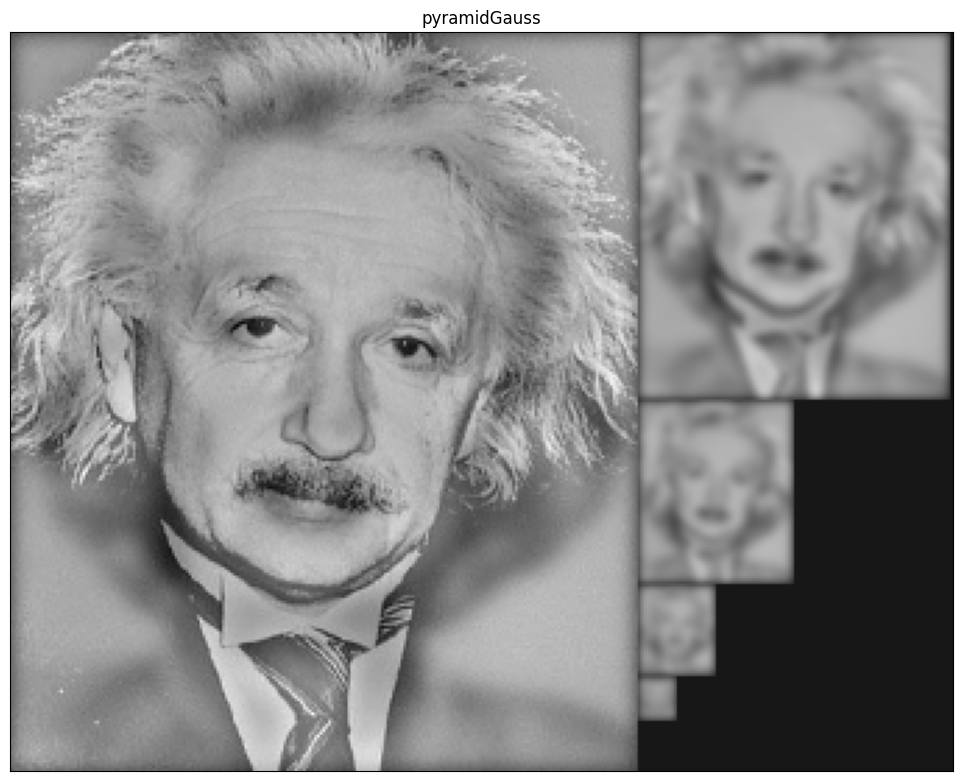

(300, 453)
[0.00055519 0.00080151 0.00113918 0.001594   0.00219583 0.00297798
 0.00397613 0.00522652 0.00676362 0.00861707 0.01080823 0.01334638
 0.01622508 0.01941887 0.02288103 0.02654245 0.03031243 0.03408118
 0.03772443 0.04110976 0.04410433 0.04658346 0.04843913 0.04958783
 0.04997675 0.04958783 0.04843913 0.04658346 0.04410433 0.04110976
 0.03772443 0.03408118 0.03031243 0.02654245 0.02288103 0.01941887
 0.01622508 0.01334638 0.01080823 0.00861707 0.00676362 0.00522652
 0.00397613 0.00297798 0.00219583 0.001594   0.00113918 0.00080151
 0.00055519]
adios
(300, 453)
[0.00074014 0.00120345 0.00190318 0.0029273  0.00437917 0.00637166
 0.00901673 0.01241029 0.01661312 0.02163001 0.02739041 0.03373468
 0.04041019 0.04708053 0.05334924 0.05879647 0.06302467 0.06570618
 0.06662513 0.06570618 0.06302467 0.05879647 0.05334924 0.04708053
 0.04041019 0.03373468 0.02739041 0.02163001 0.01661312 0.01241029
 0.00901673 0.00637166 0.00437917 0.0029273  0.00190318 0.00120345
 0.00074014]
[0.00147

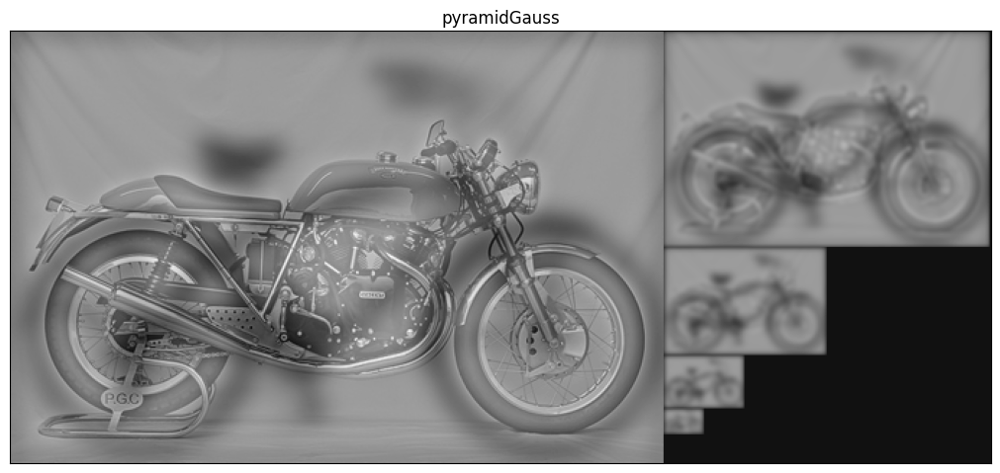

(361, 410)
[0.0004442  0.00059661 0.00079335 0.00104447 0.0013614  0.00175683
 0.00224457 0.00283917 0.00355556 0.00440841 0.00541143 0.00657657
 0.00791305 0.00942639 0.01111742 0.01298134 0.01500694 0.017176
 0.01946296 0.02183497 0.02425234 0.0266693  0.02903532 0.03129671
 0.03339857 0.03528694 0.03691113 0.03822589 0.03919358 0.03978592
 0.03998534 0.03978592 0.03919358 0.03822589 0.03691113 0.03528694
 0.03339857 0.03129671 0.02903532 0.0266693  0.02425234 0.02183497
 0.01946296 0.017176   0.01500694 0.01298134 0.01111742 0.00942639
 0.00791305 0.00657657 0.00541143 0.00440841 0.00355556 0.00283917
 0.00224457 0.00175683 0.0013614  0.00104447 0.00079335 0.00059661
 0.0004442 ]
adios
(361, 410)
[0.00074014 0.00120345 0.00190318 0.0029273  0.00437917 0.00637166
 0.00901673 0.01241029 0.01661312 0.02163001 0.02739041 0.03373468
 0.04041019 0.04708053 0.05334924 0.05879647 0.06302467 0.06570618
 0.06662513 0.06570618 0.06302467 0.05879647 0.05334924 0.04708053
 0.04041019 0.03373468 

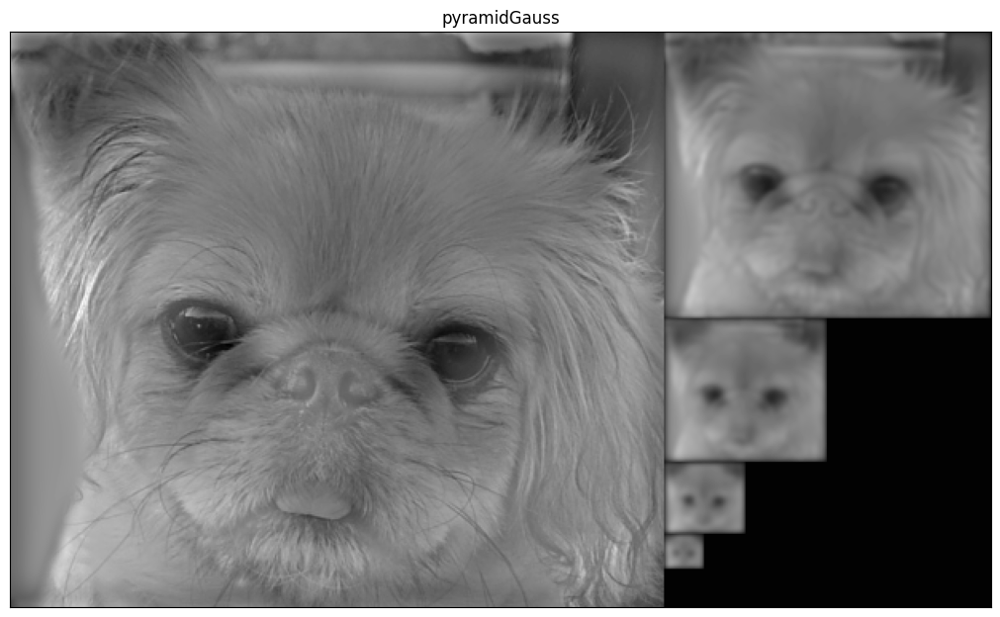

In [ ]:
#A COMPLETAR POR EL ALUMNADO
def BajaFrecuencia(imagen,sigma):
  return my2DConv(imagen,sigma,[0,0])

def GeneracionEfectoOptico (imagen1, imagen2, sigma1, sigma2):
  im1 = cv2.imread(get_image(imagen1), cv2.IMREAD_GRAYSCALE)
  im2 = cv2.imread(get_image(imagen2), cv2.IMREAD_GRAYSCALE)

  im1 = BajaFrecuencia(im1,sigma1)
  im3  = BajaFrecuencia(im2,sigma2)

  im2 = im2 - im3
  im = im1 + im2
  pyrG = pyramidGauss(im,sizeMask=7, nlevel=4)
  displayPyramid(pyrG, 'pyramidGauss')



GeneracionEfectoOptico('marilyn.bmp','einstein.bmp',4,7)
GeneracionEfectoOptico('bicycle.bmp','motorcycle.bmp',8,6)
GeneracionEfectoOptico('cat.bmp','dog.bmp',10,6)



# FENÓMENO DE GIBBS

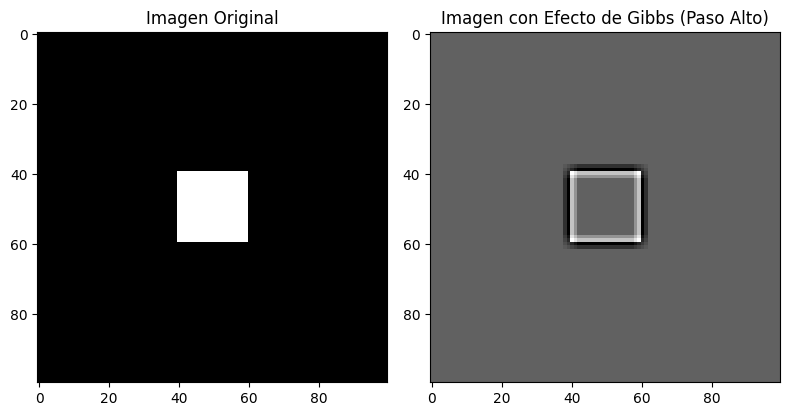

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

# Crear una imagen simple con un borde nítido
imagen = np.zeros((100, 100))
imagen[40:60, 40:60] = 255  # Un cuadro blanco en un fondo negro

# Definir el kernel para suavizar (filtro de media)
kernel = np.ones((5, 5)) / 25

# Aplicar el filtro de media para suavizar la imagen
imagen_suavizada = convolve2d(imagen, kernel, mode='same', boundary='wrap')

# Aplicar una operación de paso alto (resta de la imagen suavizada a la imagen original)
imagen_paso_alto = imagen - imagen_suavizada

# Tramar la imagen original y la imagen resultante
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(imagen, cmap='gray')
plt.title('Imagen Original')

plt.subplot(1, 2, 2)
plt.imshow(imagen_paso_alto, cmap='gray')
plt.title('Imagen con Efecto de Gibbs (Paso Alto)')

plt.tight_layout()
plt.show()

#Por eso previamente se hace un filtro de suavizado siempre => en realidad todo esto va en consonancia con las sumas de fejer

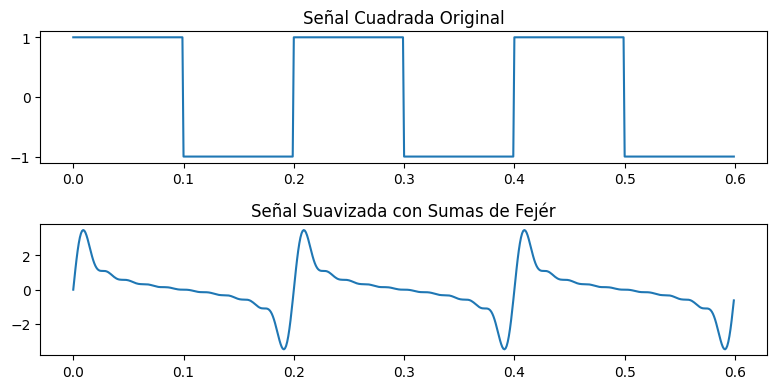

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Crear una señal cuadrada periódica
frecuencia = 5
periodo = 1 / frecuencia
duracion = 3 * periodo
muestras_por_periodo = 1000
t = np.linspace(0, duracion, int(duracion * muestras_por_periodo), endpoint=False)
senal_cuadrada = np.where(np.sin(2 * np.pi * frecuencia * t) >= 0, 1, -1)

# Calcular las Sumas de Fejér (suavización)
num_armónicos = 10  # Número de armónicos a considerar
suma_fejer = np.zeros_like(t)

for n in range(1, num_armónicos + 1):
    suma_fejer += (1 - n / (num_armónicos + 1)) * np.sin(2 * np.pi * n * frecuencia * t)

# Tramar la señal original y la señal suavizada
plt.figure(figsize=(8, 4))
plt.subplot(2, 1, 1)
plt.plot(t, senal_cuadrada)
plt.title('Señal Cuadrada Original')

plt.subplot(2, 1, 2)
plt.plot(t, suma_fejer)
plt.title('Señal Suavizada con Sumas de Fejér')

plt.tight_layout()
plt.show()


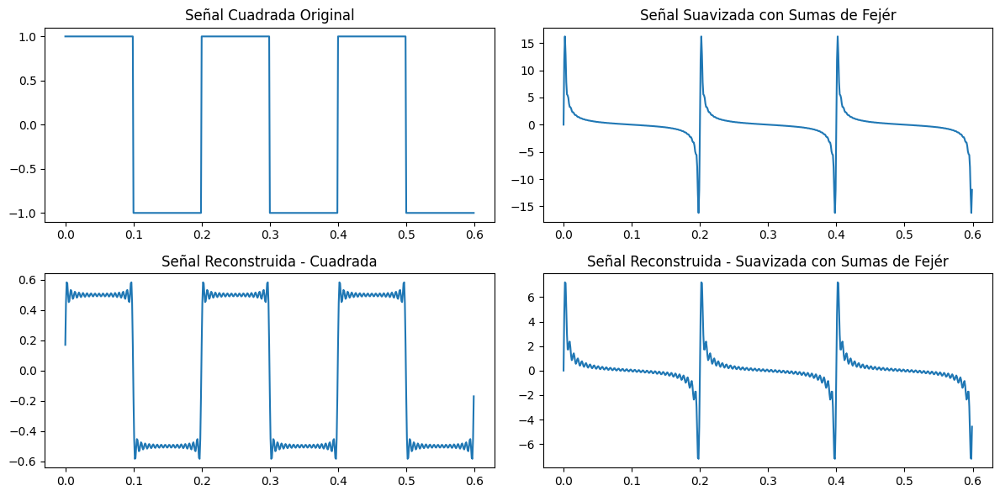

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft, ifft

# Crear una señal cuadrada periódica
frecuencia = 5
periodo = 1 / frecuencia
duracion = 3 * periodo
muestras_por_periodo = 1000
t = np.linspace(0, duracion, int(duracion * muestras_por_periodo), endpoint=False)
senal_cuadrada = np.where(np.sin(2 * np.pi * frecuencia * t) >= 0, 1, -1)

# Calcular las Sumas de Fejér (suavización)
num_armónicos = 50  # Número de armónicos a considerar
suma_fejer = np.zeros_like(t)

for n in range(1, num_armónicos + 1):
    coeficiente_n = (1 - n / (num_armónicos + 1))
    suma_fejer += coeficiente_n * np.sin(2 * np.pi * n * frecuencia * t)

# Calcular los coeficientes de Fourier de alto orden
orden_alto = 100  # Número de coeficientes de Fourier de alto orden a calcular

coeficientes_cuadrada = fft(senal_cuadrada)
coeficientes_cuadrada[orden_alto:] = 0  # Establecer los coeficientes de alto orden en cero

coeficientes_fejer = fft(suma_fejer)
coeficientes_fejer[orden_alto:] = 0  # Establecer los coeficientes de alto orden en cero

# Reconstruir las señales a partir de los coeficientes de Fourier
senal_reconstruida_cuadrada = ifft(coeficientes_cuadrada)
senal_reconstruida_fejer = ifft(coeficientes_fejer)

# Tramar las señales originales y reconstruidas
plt.figure(figsize=(12, 6))
plt.subplot(2, 2, 1)
plt.plot(t, senal_cuadrada)
plt.title('Señal Cuadrada Original')

plt.subplot(2, 2, 2)
plt.plot(t, suma_fejer)
plt.title('Señal Suavizada con Sumas de Fejér')

plt.subplot(2, 2, 3)
plt.plot(t, np.real(senal_reconstruida_cuadrada))
plt.title('Señal Reconstruida - Cuadrada')

plt.subplot(2, 2, 4)
plt.plot(t, np.real(senal_reconstruida_fejer))
plt.title('Señal Reconstruida - Suavizada con Sumas de Fejér')

plt.tight_layout()
plt.show()



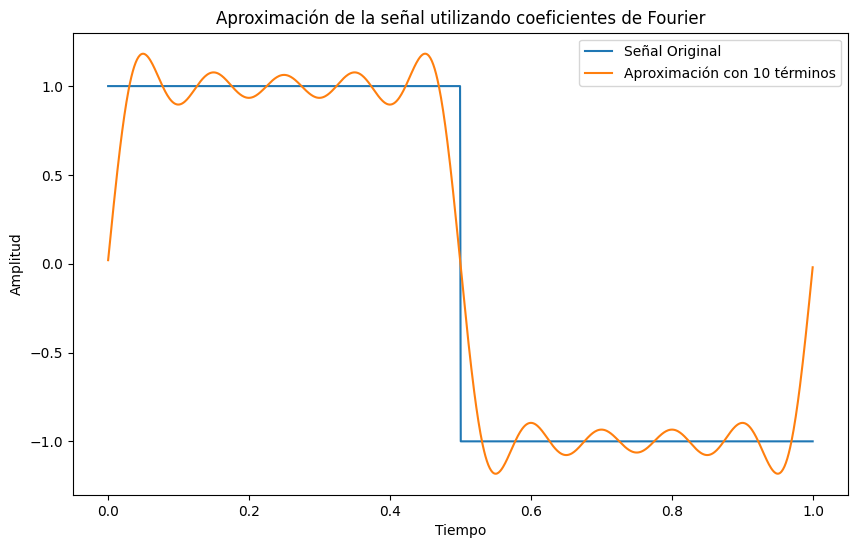

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define la función que representa tu señal (por ejemplo, una onda cuadrada)
def signal(t):
    return 2.0 * (t % 1.0 < 0.5) - 1.0

# Define una función para calcular los coeficientes de Fourier
def fourier_coefficients(signal, N):
    T = 1.0  # Período de la señal
    num_samples = 1000  # Número de muestras
    t = np.linspace(0.0, T, num_samples, endpoint=False)
    dt = T / num_samples
    result = []

    for n in range(N):
        cn = 2.0 * np.trapz(signal(t) * np.exp(-2j * np.pi * n * t / T), t)  # Multiplicamos por 2 aquí
        result.append(cn / T)

    return result

# Define una función para aproximar la señal utilizando los coeficientes de Fourier
def approximate_signal(coefficients, t):
    T = 1.0
    approx_signal = np.zeros_like(t, dtype=complex)
    for n, cn in enumerate(coefficients):
        approx_signal += cn * np.exp(2j * np.pi * n * t / T)

    return approx_signal.real

# Calcular los coeficientes de Fourier y aproximar la señal con N términos
N = 10
coefficients = fourier_coefficients(signal, N)

t = np.linspace(0.0, 1.0, 1000, endpoint=False)
approximated_signal = approximate_signal(coefficients, t)
original_signal = signal(t)

# Dibuja la señal original y la aproximada
plt.figure(figsize=(10, 6))
plt.plot(t, original_signal, label='Señal Original')
plt.plot(t, approximated_signal, label=f'Aproximación con {N} términos')
plt.legend()
plt.title('Aproximación de la señal utilizando coeficientes de Fourier')
plt.xlabel('Tiempo')
plt.ylabel('Amplitud')
plt.show()


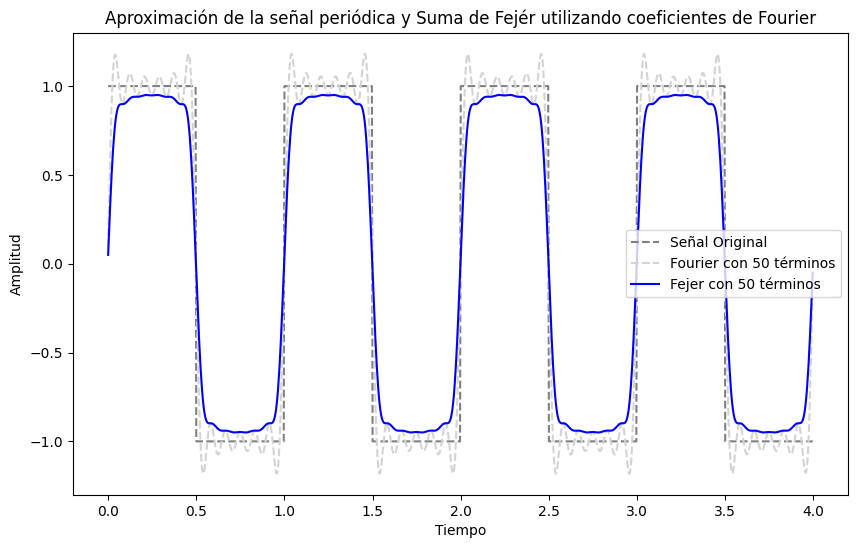

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define el período de la señal
T_periodo = 4.0  # Período de la señal (en segundos)

# Define la función que representa tu señal periódica (por ejemplo, una onda cuadrada)
def signal(t):
    t = t % T_periodo  # Hacer que la señal sea periódica repitiendo cada T_periodo segundos
    return 2.0 * (t % 1.0 < 0.5) - 1.0

# Define una función para calcular los coeficientes de Fourier
def fourier_coefficients(signal, N):
    num_samples = 1000  # Número de muestras
    t = np.linspace(0.0, T_periodo, num_samples, endpoint=False)
    dt = T_periodo / num_samples
    result = []

    for n in range(N):
        cn = 2.0 * np.trapz(signal(t) * np.exp(-2j * np.pi * n * t / T_periodo), t)
        result.append(cn / T_periodo)

    return result

# Define una función para aproximar la señal periódica utilizando los coeficientes de Fourier
def approximate_signal(coefficients, t):
    approx_signal = np.zeros_like(t, dtype=complex)
    for n, cn in enumerate(coefficients):
        approx_signal += cn * np.exp(2j * np.pi * n * t / T_periodo)

    return approx_signal.real

# Define una función para calcular la suma de Fejér
def fejer_sum(coefficients, t):
    num_terms = len(coefficients)
    fejer_sum = np.zeros_like(t, dtype=complex)
    for n in range(num_terms):
        fejer_term = approximate_signal(coefficients[:n+1], t)
        fejer_sum += fejer_term
    fejer_sum /= num_terms
    return fejer_sum.real

# Calcular los coeficientes de Fourier y aproximar la señal periódica con N términos
N = 50
coefficients = fourier_coefficients(signal, N)

t = np.linspace(0.0, T_periodo, 1000, endpoint=False)
approximated_signal = approximate_signal(coefficients, t)
original_signal = signal(t)

# Calcular la suma de Fejér
fejer_signal = fejer_sum(coefficients, t)

# Dibuja la señal original, la aproximada y la suma de Fejér
plt.figure(figsize=(10, 6))
plt.plot(t, original_signal, label='Señal Original', linestyle='--', color='gray')
plt.plot(t, approximated_signal, label=f'Fourier con {N} términos', linestyle='--', color='lightgray')
plt.plot(t, fejer_signal, label=f'Fejer con {N} términos', color='blue')
plt.legend()
plt.title('Aproximación de la señal periódica y Suma de Fejér utilizando coeficientes de Fourier')
plt.xlabel('Tiempo')
plt.ylabel('Amplitud')
plt.show()





NameError: ignored

posibilidad de aplicar esto en imagenes, fejer y fourier relacion? fejer y transformada? transfromada y coeficientes?


